In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/toothbrush/043.png
/kaggle/input/toothbrush/038.png
/kaggle/input/toothbrush/027.png
/kaggle/input/toothbrush/053.png
/kaggle/input/toothbrush/007.png
/kaggle/input/toothbrush/023.png
/kaggle/input/toothbrush/016.png
/kaggle/input/toothbrush/005.png
/kaggle/input/toothbrush/031.png
/kaggle/input/toothbrush/011.png
/kaggle/input/toothbrush/013.png
/kaggle/input/toothbrush/046.png
/kaggle/input/toothbrush/039.png
/kaggle/input/toothbrush/042.png
/kaggle/input/toothbrush/024.png
/kaggle/input/toothbrush/052.png
/kaggle/input/toothbrush/057.png
/kaggle/input/toothbrush/025.png
/kaggle/input/toothbrush/017.png
/kaggle/input/toothbrush/054.png
/kaggle/input/toothbrush/004.png
/kaggle/input/toothbrush/033.png
/kaggle/input/toothbrush/049.png
/kaggle/input/toothbrush/018.png
/kaggle/input/toothbrush/045.png
/kaggle/input/toothbrush/002.png
/kaggle/input/toothbrush/040.png
/kaggle/input/toothbrush/035.png
/kaggle/input/toothbrush/048.png
/kaggle/input/toothbrush/020.png
/kaggle/in

In [2]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm
import os
import cv2
import pickle as pkl

print("libraries imported successfully")

libraries imported successfully


In [3]:
data_dir = '/kaggle/input/toothbrush/'
real_size = (128,128,3)
z_size = 100
learning_rate = 0.0002
batch_size = 1
epochs = 60
alpha = 0.2
beta1 = 0.5

print("initialized variables successfully")

initialized variables successfully


In [4]:
print("finding data")
images=np.array([cv2.resize((cv2.imread(data_dir+tmp, cv2.IMREAD_COLOR)),(128, 128))
                                               for tmp in os.listdir(data_dir)])
four_fifths = int(len(images)*(4/5))
trainset = images[:four_fifths]
testset = images[four_fifths:]
print("found data")
print("test data length", len(testset))

finding data
found data
test data length 12


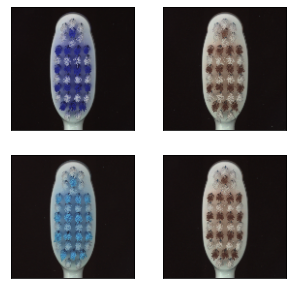

In [5]:
idx = np.random.randint(0, len(trainset), size=36)
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset[ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

In [6]:
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

<Figure size 432x288 with 0 Axes>

In [7]:
print("train.py")

train.py


In [8]:
print("training data")
def train(net, dataset, epochs, batch_size, print_every=5, show_every=10, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0
    print("starting session")
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))
                
                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})
                print("epoch #%d done optimizing" %e)

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    try:
                        _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                        plt.show()
                    except:
                        print("could not show")
        print("saving")
        try:
            saver.save(sess, './checkpoints/generator.ckpt')
        except: 
            print("could not save")

    try:
        with open('samples.pkl', 'wb') as f:
            pkl.dump(samples, f)
    except:
        pass
    
    return losses, samples

training data


In [9]:
print("model.py")

model.py


In [10]:
print("model_inputs")
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

model_inputs


In [11]:
print("generator")
def generator(z, output_dim, reuse=tf.AUTO_REUSE, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 16*16*1024)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 16, 16, 1024))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        print("x1 shape: ", x1.get_shape().as_list())
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        print("x2 shape: ", x2.get_shape().as_list())
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        print("x3 shape: ", x3.get_shape().as_list())
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        print("logits shape: ", logits.get_shape().as_list())
        
        out = tf.tanh(logits)
        
        return out

generator


In [12]:
print("discriminator")
def discriminator(x, reuse=tf.AUTO_REUSE, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 256, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        print("x1 d shape: ", x1.get_shape().as_list())
        
        x2 = tf.layers.conv2d(relu1, 512, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        print("x2 d shape: ", x2.get_shape().as_list())
        
        x3 = tf.layers.conv2d(relu2, 1024, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256
        print("x3 d shape: ", x3.get_shape().as_list())
        
        # Flatten it
        flat = tf.reshape(relu3, (-1, 16*16*1024))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        print("logits d shape: ", logits.get_shape().as_list())
        
        print("discriminated")
        return out, logits

discriminator


In [13]:
print("loss function")
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

loss function


In [14]:
print("adam optimizer")
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    print("boutta optimize")
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    print("optimized ")
    
    return d_train_opt, g_train_opt

adam optimizer


In [15]:
print("G A N")
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)



G A N


In [16]:
print("dataset.py")

dataset.py


In [17]:
print("view_samples")
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

view_samples


In [18]:
print("scaling function")
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

scaling function


In [19]:
print("DATASET")
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test)*(1 - val_frac))
        self.test_x, self.valid_x = test[:split_idx], test[split_idx:]
        
        self.train_x = train
        
        #self.train_x = np.rollaxis(self.train_x, 3)
        #self.valid_x = np.rollaxis(self.valid_x, 3)
        #self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            
        
        n_batches = len(self.train_x)//batch_size
        for ii in range(0, len(self.train_x), batch_size):
            x = self.train_x[ii:ii+batch_size]
            
            
            yield self.scaler(x)

DATASET


In [20]:
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]
x1 d shape:  [None, 64, 64, 256]
x2 d shape:  [None, 32, 32, 512]
x3 d shape:  [None, 16, 16, 1024]
logits d shape:  [None, 1]
discriminated
x1 d shape:  [None, 64, 64, 256]
x2 d shape:  [None, 32, 32, 512]
x3 d shape:  [None, 16, 16, 1024]
logits d shape:  [None, 1]
discriminated
boutta optimize
optimized 


In [21]:
#scale and prepare the data for GANifying
dataset = Dataset(trainset, testset)
print("dataset ready")

dataset ready


In [22]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

device_name = tf.test.gpu_device_name()
print("h", device_name)
if "GPU" not in device_name:    
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9948561487977174122
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 2625760908668201193
physical_device_desc: "device: XLA_CPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 15687541056
locality {
  bus_id: 1
  links {
  }
}
incarnation: 850975486907381449
physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 15424783771019485428
physical_device_desc: "device: XLA_GPU device"
]
h /device:GPU:0
Found GPU at: /device:GPU:0


blasting off
starting session
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 31.5840... Generator Loss: 0.0000
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 0.0000... Generator Loss: 22.5740
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


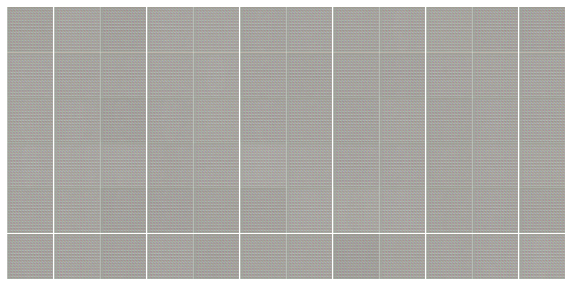

epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 0.0004... Generator Loss: 35.5157
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 0.0011... Generator Loss: 7.1421
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


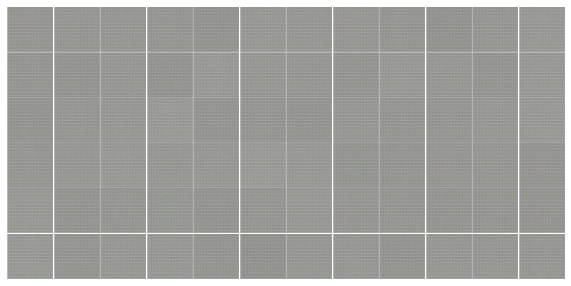

epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 52.5526... Generator Loss: 0.0000
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 0.0000... Generator Loss: 60.0231
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


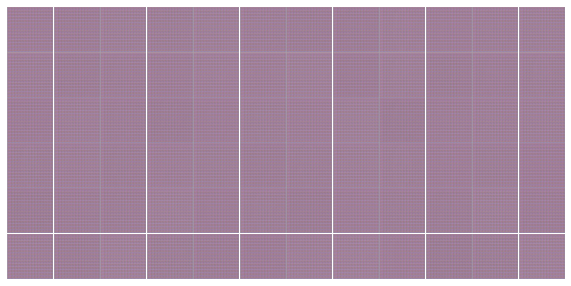

epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 0.0000... Generator Loss: 26.3362
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 35.6348... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


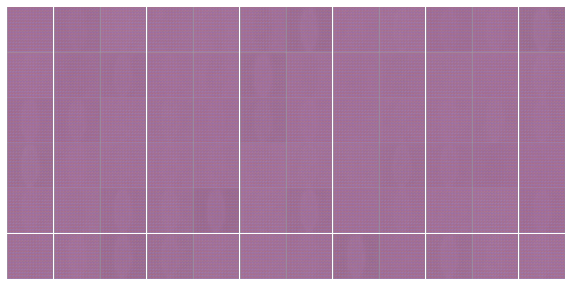

epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
Epoch 1/60... Discriminator Loss: 27.4955... Generator Loss: 0.0000
epoch #0 done optimizing
epoch #0 done optimizing
epoch #0 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 0.0001... Generator Loss: 9.3904
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


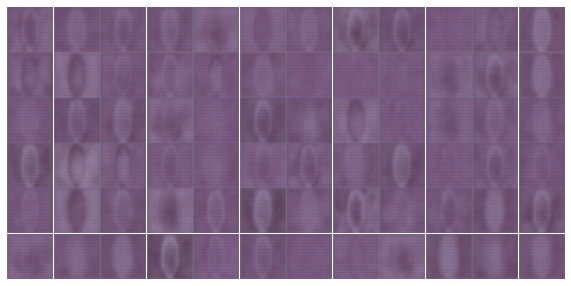

epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 3.0579... Generator Loss: 0.0481
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 15.2873... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


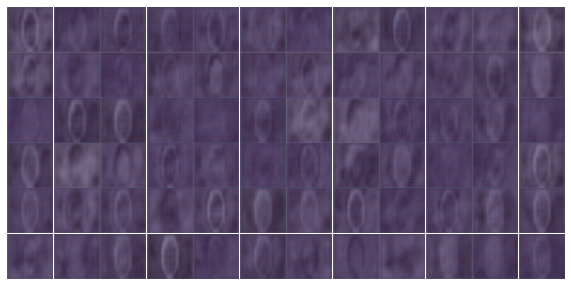

epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 16.4034... Generator Loss: 0.0000
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 13.1692... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


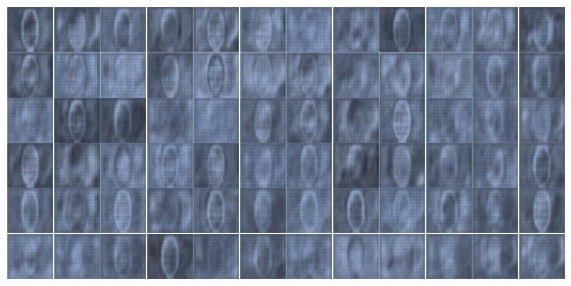

epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 0.0000... Generator Loss: 16.4260
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 0.0001... Generator Loss: 9.6285
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


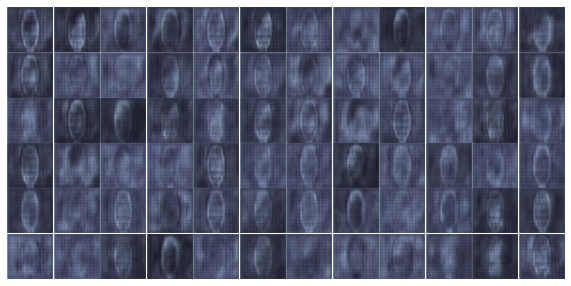

epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 36.0646... Generator Loss: 45.8769
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 1.3494... Generator Loss: 8.7435
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


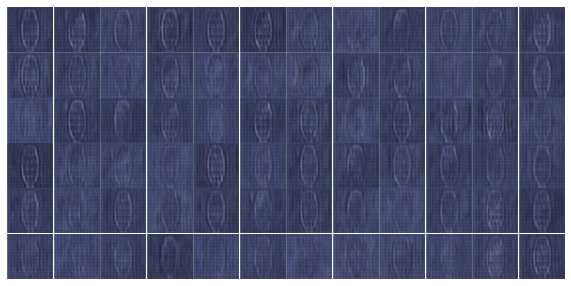

epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
epoch #1 done optimizing
Epoch 2/60... Discriminator Loss: 41.6518... Generator Loss: 0.0000
epoch #1 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 0.0014... Generator Loss: 19.9061
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


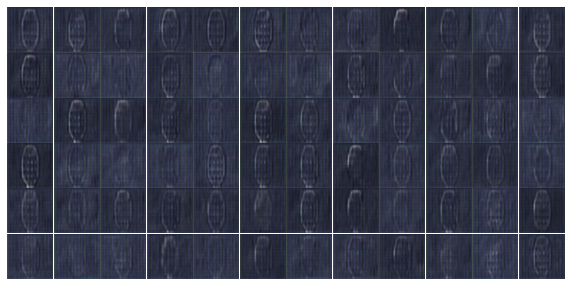

epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 0.0000... Generator Loss: 25.1031
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 0.0002... Generator Loss: 8.3591
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


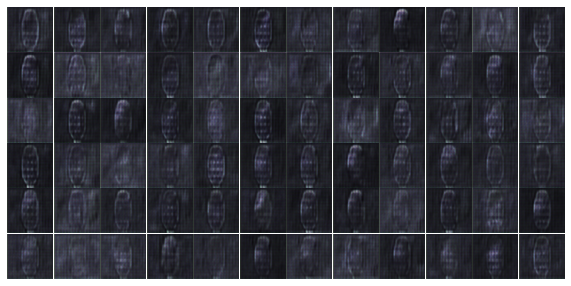

epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 24.1112... Generator Loss: 37.6579
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 23.6057... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


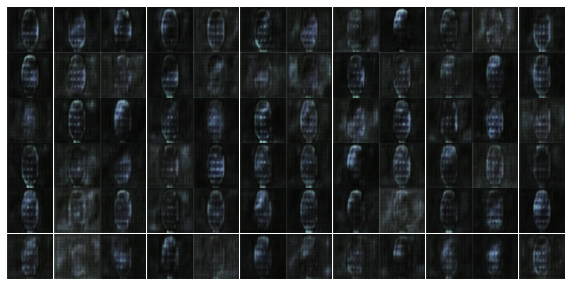

epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 36.6538... Generator Loss: 0.0000
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 11.8654... Generator Loss: 3.6243
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


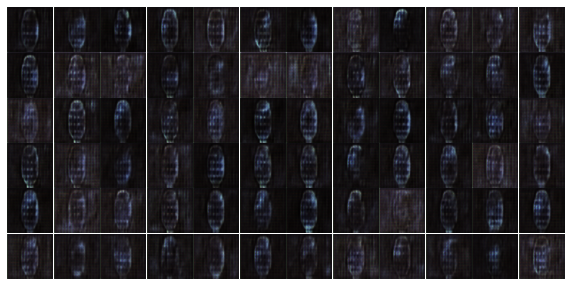

epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 31.4790... Generator Loss: 17.8866
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
Epoch 3/60... Discriminator Loss: 4.9768... Generator Loss: 0.0101
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


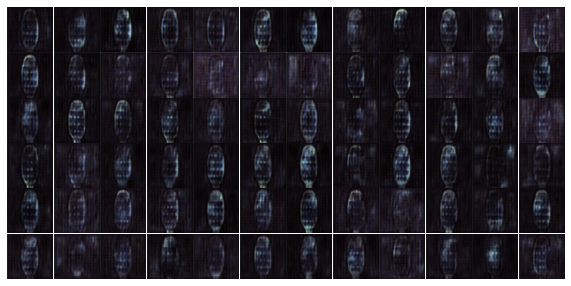

epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #2 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 7.2128... Generator Loss: 11.6205
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 0.0007... Generator Loss: 7.2491
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


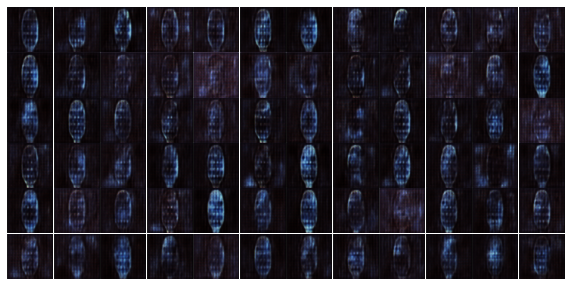

epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 0.0000... Generator Loss: 11.1585
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 9.7374... Generator Loss: 0.0001
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


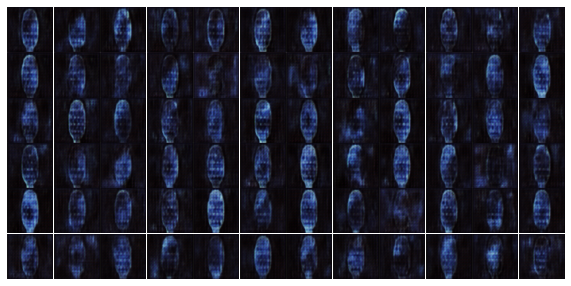

epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 0.0083... Generator Loss: 4.7921
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 0.0000... Generator Loss: 12.7963
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


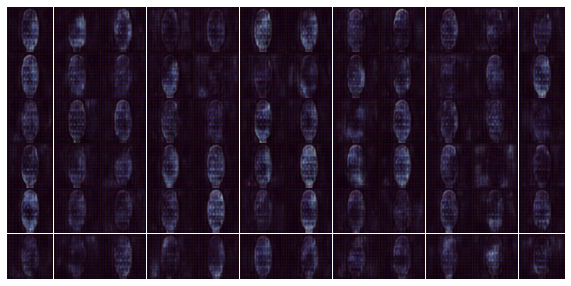

epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 16.0233... Generator Loss: 0.0000
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 4.0944... Generator Loss: 0.0171
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


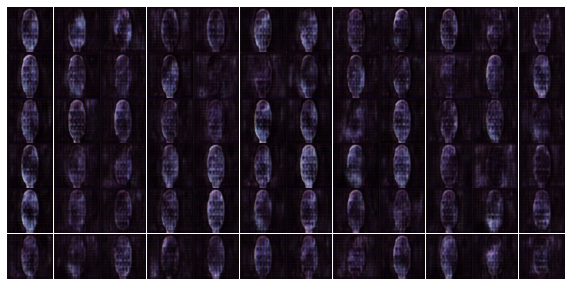

epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 20.5672... Generator Loss: 0.0000
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
epoch #3 done optimizing
Epoch 4/60... Discriminator Loss: 19.1151... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


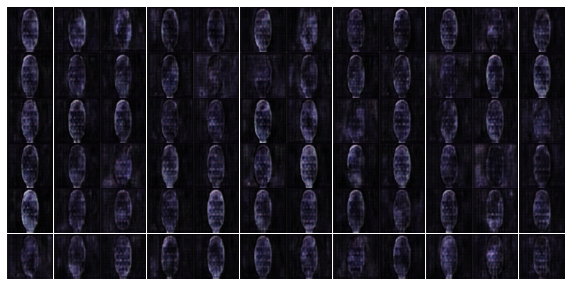

epoch #3 done optimizing
epoch #3 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 20.4695... Generator Loss: 0.0000
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 22.1332... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


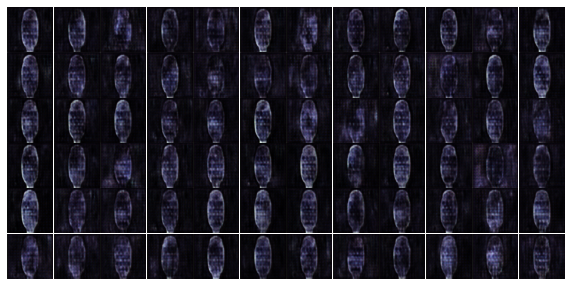

epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 24.5114... Generator Loss: 0.0000
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 0.5234... Generator Loss: 1.1692
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


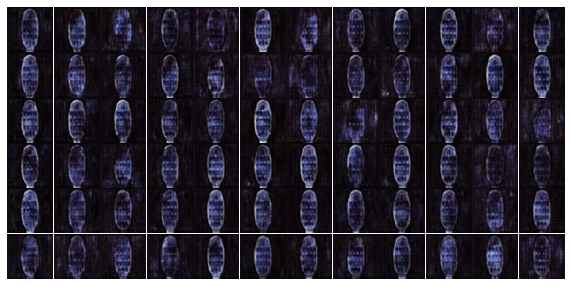

epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 7.1793... Generator Loss: 0.0023
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 10.8156... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


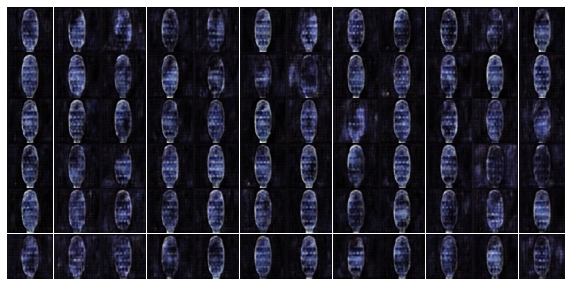

epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 4.7761... Generator Loss: 0.0148
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 22.5702... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


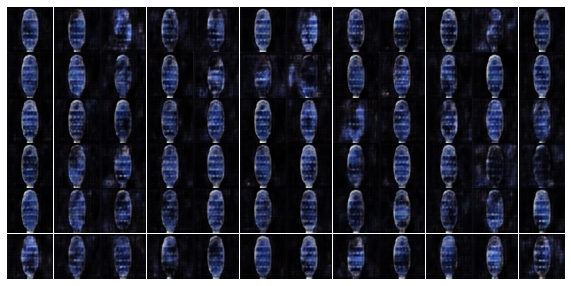

epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 7.2391... Generator Loss: 3.2373
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
epoch #4 done optimizing
Epoch 5/60... Discriminator Loss: 12.7325... Generator Loss: 5.5525
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


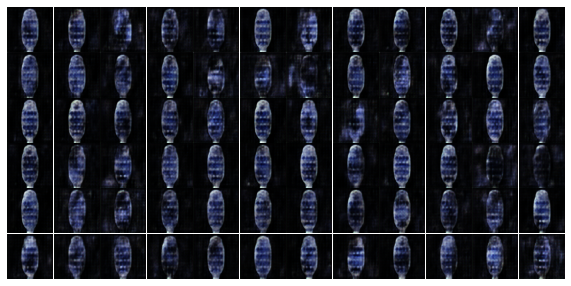

epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 22.6222... Generator Loss: 0.0000
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 21.2717... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


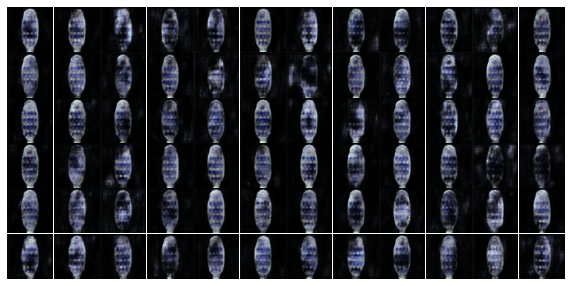

epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 8.8746... Generator Loss: 0.0001
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 10.6710... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


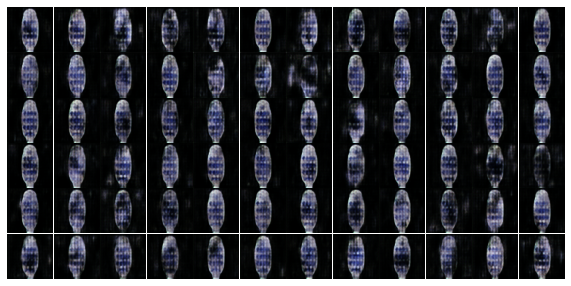

epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 3.2407... Generator Loss: 5.4558
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 8.2187... Generator Loss: 7.6613
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


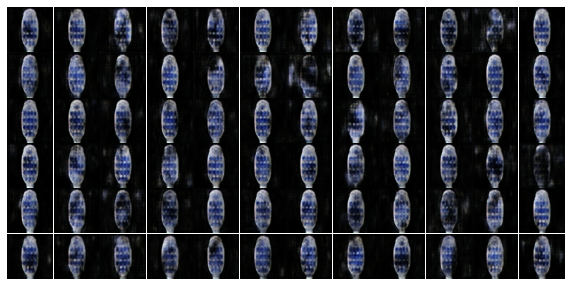

epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 16.6852... Generator Loss: 0.0000
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 24.5538... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


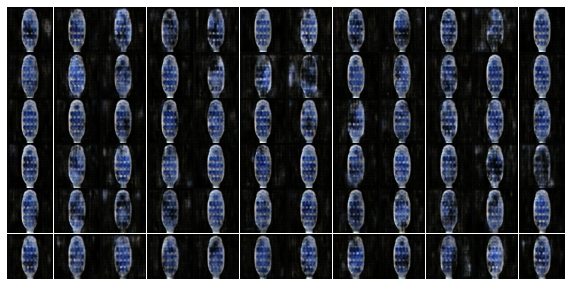

epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
Epoch 6/60... Discriminator Loss: 5.8680... Generator Loss: 0.0029
epoch #5 done optimizing
epoch #5 done optimizing
epoch #5 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 9.6016... Generator Loss: 0.0001
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


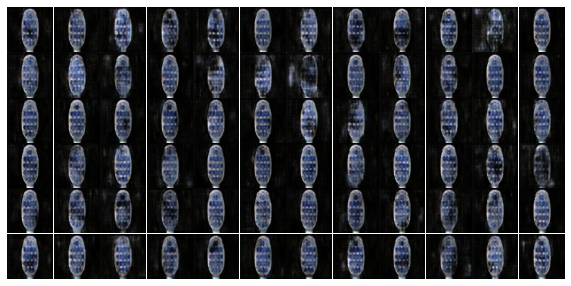

epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 4.2275... Generator Loss: 0.0147
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 23.9034... Generator Loss: 21.5158
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


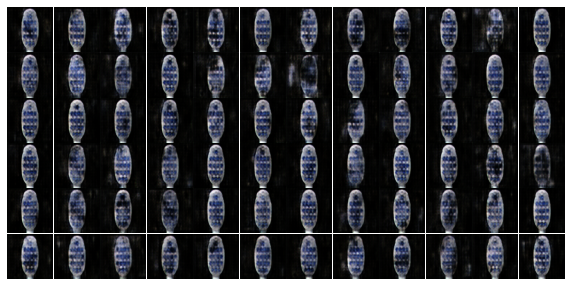

epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 3.4979... Generator Loss: 0.3774
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 7.8185... Generator Loss: 0.0004
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


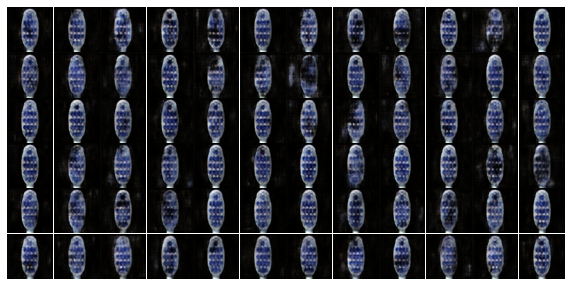

epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 20.3494... Generator Loss: 19.8384
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 5.7616... Generator Loss: 0.0032
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


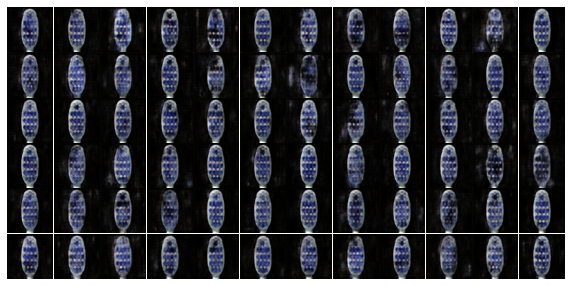

epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 4.4637... Generator Loss: 0.0116
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 6.0205... Generator Loss: 0.0024
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


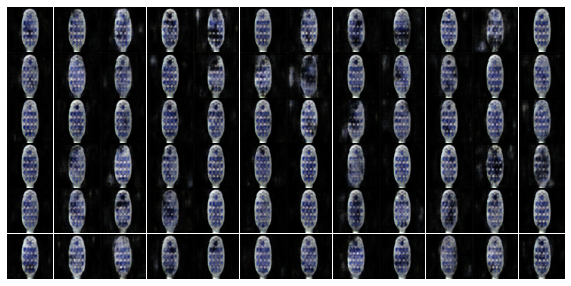

epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
epoch #6 done optimizing
Epoch 7/60... Discriminator Loss: 2.2413... Generator Loss: 0.1137
epoch #6 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 8.8976... Generator Loss: 0.0001
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


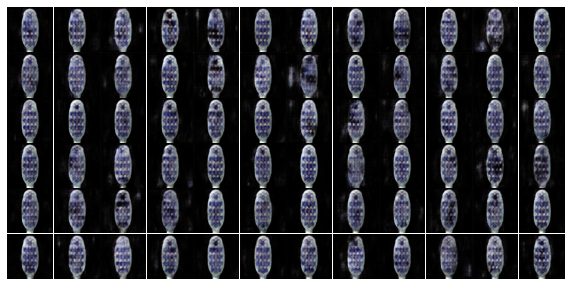

epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 5.6901... Generator Loss: 3.6961
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 0.7089... Generator Loss: 2.1748
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


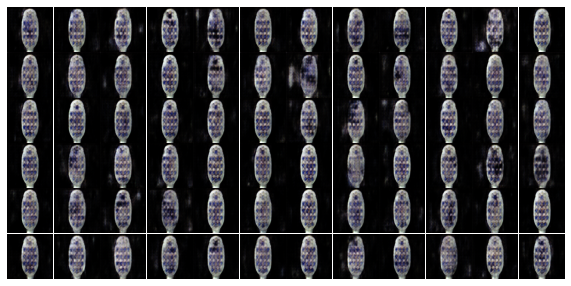

epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 2.8654... Generator Loss: 3.6340
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 20.3884... Generator Loss: 14.1559
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


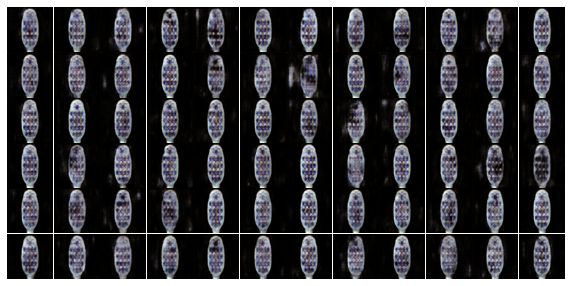

epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 2.6660... Generator Loss: 4.5248
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 3.7747... Generator Loss: 0.0306
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


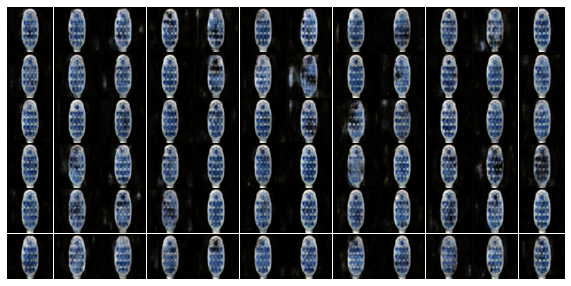

epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 7.8237... Generator Loss: 0.0004
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
Epoch 8/60... Discriminator Loss: 3.2308... Generator Loss: 4.1148
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


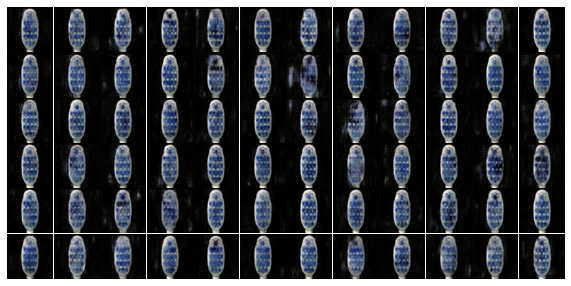

epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #7 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 3.8254... Generator Loss: 0.0222
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 7.0670... Generator Loss: 0.0009
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


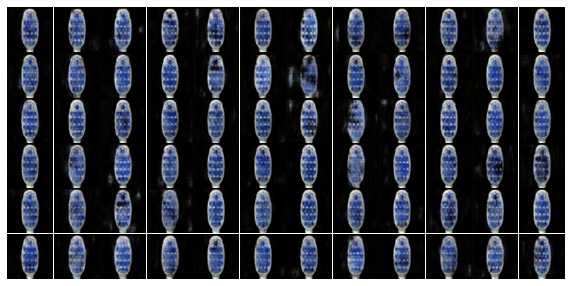

epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 0.3415... Generator Loss: 2.2181
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 1.3442... Generator Loss: 0.3067
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


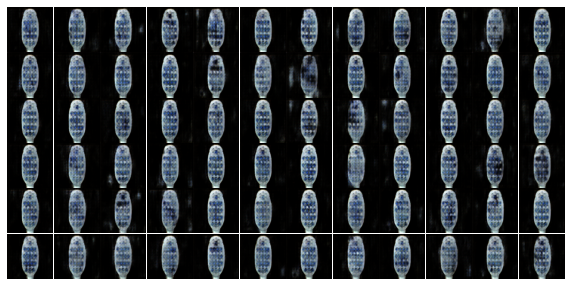

epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 5.8640... Generator Loss: 0.0029
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 15.7065... Generator Loss: 0.0000
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


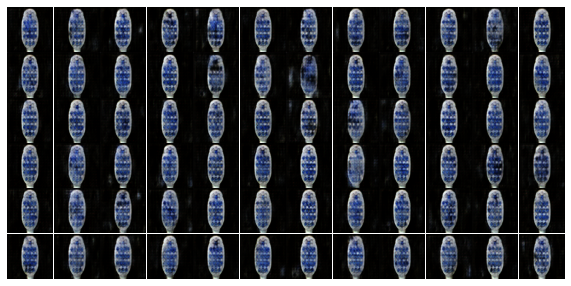

epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 7.5484... Generator Loss: 0.0005
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
epoch #8 done optimizing
Epoch 9/60... Discriminator Loss: 7.8558... Generator Loss: 0.0004
x1 shape:  [None, 16, 16, 1024]
x2 shape:  [None, 32, 32, 512]
x3 shape:  [None, 64, 64, 256]
logits shape:  [None, 128, 128, 3]


In [ ]:
print("blasting off")
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:

#print(samples)
X = view_samples(-1, samples, 4, 4, figsize=(10,5))
y = samples[-1]
print(y)

In [ ]:
#Encoder net. To run Autoencoder on GAN generated images. 
input_image = Input(shape=(X.shape[1:]), name='encoder_input')
x = Conv2D(128, (3, 3), activation='relu', padding='same')(input_image)
x = MaxPooling2D((2,2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2), padding='same')(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2), padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2), padding='same')(x)
x = Conv2D(4, (3,3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2), padding='same')(x)
encoder = Dense(512, activation='relu')(x)

#Decoder net
x = Conv2D(4, (3,3), activation='relu', padding='same')(encoder)
x = UpSampling2D((2,2))(x)
x = Conv2D(8, (3,3), activation='relu', padding='same')(x)
x = UpSampling2D((2,2))(x)
x = Conv2D(16, (3,3), activation='relu', padding='same')(x)
x = UpSampling2D((2,2))(x)
x = Conv2D(64, (3,3), activation='relu', padding='same')(x)
x = UpSampling2D((2,2))(x)
x = Conv2D(128, (3,3), activation='relu', padding='same')(x)
x = UpSampling2D((2,2))(x)
decoder = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(x)

#Fault Tolerance checks 
callbacks = [
    EarlyStopping(patience = 5, monitor = 'val_loss')]

autoencoder = Model(input_image, decoder)
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

history = autoencoder.fit(X, X, epochs=20, validation_split=0.05, batch_size=20,
                         callbacks=callbacks)